# Deep Learning for Coders - Lesson 1 Notes
Look at the book as well!

### What you don't need, to do deep learning:

|Myth (don't need) | Truth|
|------------------|------|	
Lots of math | Just high school math is sufficient|
Lots of data | We've seen record-breaking results with <50 items of data|
Lots of expensive computers | You can get what you need for state of the art work for free|

### Where is deep learning the best-known approach? (Is there any point learning Deep Learning?)
Deep learning has power, flexibility, and simplicity. That's why we believe it should be applied across many disciplines. These include the social and physical sciences, the arts, medicine, finance, scientific research, and many more. Here's a list of some of the thousands of tasks in different areas at which deep learning, or methods heavily using deep learning, is now the best in the world:

* **Natural language processing (NLP)** Answering questions; speech recognition; summarizing documents; classifying documents; finding names, dates, etc. in documents; searching for articles mentioning a concept

* **Computer vision** Satellite and drone imagery interpretation (e.g., for disaster resilience); face recognition; image captioning; reading traffic signs; locating pedestrians and vehicles in autonomous vehicles

* **Medicine** Finding anomalies in radiology images, including CT, MRI, and X-ray images; counting features in pathology slides; measuring features in ultrasounds; diagnosing diabetic retinopathy

* **Biology** Folding proteins; classifying proteins; many genomics tasks, such as tumor-normal sequencing and classifying clinically actionable genetic mutations; cell classification; analyzing protein/protein interactions

* **Image generation** Colorizing images; increasing image resolution; removing noise from images; converting images to art in the style of famous artists

* **Recommendation systems** Web search; product recommendations; home page layout

* **Playing games** Chess, Go, most Atari video games, and many real-time strategy games

* **Robotics** Handling objects that are challenging to locate (e.g., transparent, shiny, lacking texture) or hard to pick up

* **Other applications** Financial and logistical forecasting, text to speech, and much more...

### Neural Networks: a breif history
n 1943 Warren McCulloch, a neurophysiologist, and Walter Pitts, a logician, teamed up to develop a mathematical model of an artificial neuron. In their paper "A Logical Calculus of the Ideas Immanent in Nervous Activity" they declared that:

> "Because of the 'all-or-none' character of nervous activity, neural events and the relations among them can be treated by means of propositional logic. It is found that the behavior of every net can be described in these terms."


In [13]:
from IPython.display import Image
Image(url= "Images/chapter7_neuron.png")

To learn more about the history (which although important, isn't that necessary to learn), go through the book or online course yourself.

### The Software Stack
 
In the framework of fastai, the product stack is quite minimal, going from the most broad to the least broad below:
* **Python**
    * Extremely extensible, and allows for many framworks to be based ontop of it
* **PyTorch**
  * The fastest growing Machine Learning/Deep Learning framework (With a lot of industry backing). Although less mature compared to TensorFlow, it is backed by large companies, and is easier to work with. Less 'bogged down' and 'bloated'.
  * Most new models and development are done for PyTorch, rather than TensorFlow
* **fastai**
  * A framework built on top of PyTorch, and allows for the easier development of Deep Learning models specifically.
  * Allows for the quicker development (via a higher level API)
  * fastai is incredibly powerful, and it allows for people to learn/develop etc.
    * **Layered API**
      * Allows for people to have a simpler base level, while being able to go deeper (from very high level work, to extremely low level research and state of the art development).

### Getting a GPU deep learning server
Most things require using a GPU (of which has to be a Nvidia GPU, due to the extensive use of CUDA). It is recommended not to buy one right away (or to even set up a GPU that you may have laying around). If you cannot afford/have access to a system, use Google Collab to start, and look on the fastai Forum).

### Running Your First Jupyter Notebook!
Here I'll put in the fist piece of code that we are exposed to, and run it.

Please note that I have made some changes to the code to allow for some more information about the hardware, and due to some issues that I was facing. I will explain every change I have made where necessary.

In [15]:
import gc
gc.collect() #This in *very* simple terms is able to collect everything that is held on the GPU's VRAM, and is able to purge it.

41

In [16]:
import torch

torch.cuda.empty_cache() #Another method to purge GPU VRAM, as I was having issues with previous runs of this program not purging, and therefore causing memory overflows.

In [17]:
with torch.no_grad():
    torch.cuda.empty_cache() #Same function as above, although I kept it here for future reference, in case this is a more suitable implementation.

In [18]:
from fastai.vision.all import *
path = untar_data(URLs.PETS)/'images'

def is_cat(x): return x[0].isupper()
dls = ImageDataLoaders.from_name_func(
    path, get_image_files(path), valid_pct=0.2, seed=42,
    label_func=is_cat, item_tfms=Resize(224))

# This block of code allows for me to confirm if I am using the GPU, and that I am able to use CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda, allows for me to understand if there is a memory leak or overflow, and also tweak different values depending on my specific GPU
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')

print(torch.cuda.memory_summary(device=None, abbreviated=False))

learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)

Using device: cuda

NVIDIA GeForce GTX 1660 Ti with Max-Q Design
Memory Usage:
Allocated: 0.3 GB
Cached:    0.4 GB
|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |  347295 KB |    3429 MB |    3518 GB |    3518 GB |
|       from large pool |  322688 KB |    3423 MB |    3515 GB |    3515 GB |
|       from small pool |   24607 KB |      27 MB |       3 GB |       3 GB |
|---------------------------------------------------------------------------|
| Active memory         |  

epoch,train_loss,valid_loss,error_rate,time
0,0.182583,0.027967,0.010149,00:31


epoch,train_loss,valid_loss,error_rate,time
0,0.058491,0.024001,0.007442,00:41


The time it takes to train will depend on the GPU! As I am using quite modern hardware, it took an average time of about 30 seconds per epoch, and this process should not take more than 5 minutes. This is just a test to check that you run code within your environment.

Don't worry if you don't know what is happening in the code, this will be explained later.

This code is fetching the 'pets' dataset (i.e. a dataset which has labelled pictures of cats and dogs), and trying to figure out which one is a cat, and which one is a dog.

After about a minute of training, it is able to identify cats from dogs with about a 0.3% error rate.

Here is a picture of a cat. Now let's try and test the Model that we just created for our selves...

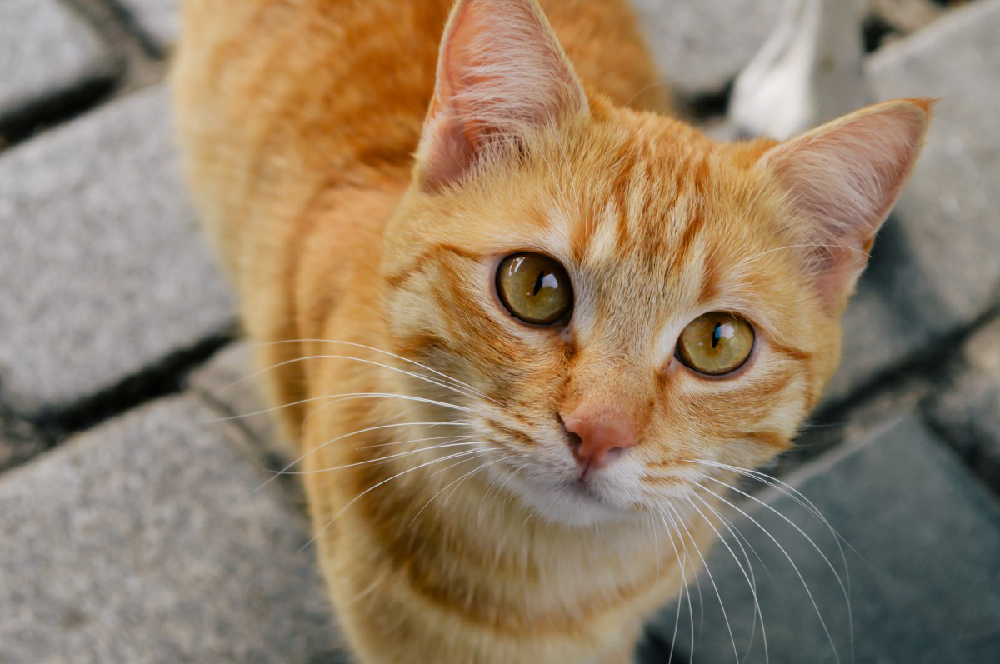

In [19]:
from PIL import Image

img = PILImage.create('Images/cat.jpeg')

Image.open("Images/cat.jpeg")


In [20]:
is_cat,_,probs = learn.predict(img)
print(f"Is this a cat?: {is_cat}.")
print(f"Probability it's a cat: {probs[1].item():.6f}")

Is this a cat?: True.
Probability it's a cat: 1.000000


As you can see via the output, this model predicts that the above image is a cat (and is 100% sure of it). Now let's try it with a dog and make sure that it can tell that it isn't a cat.

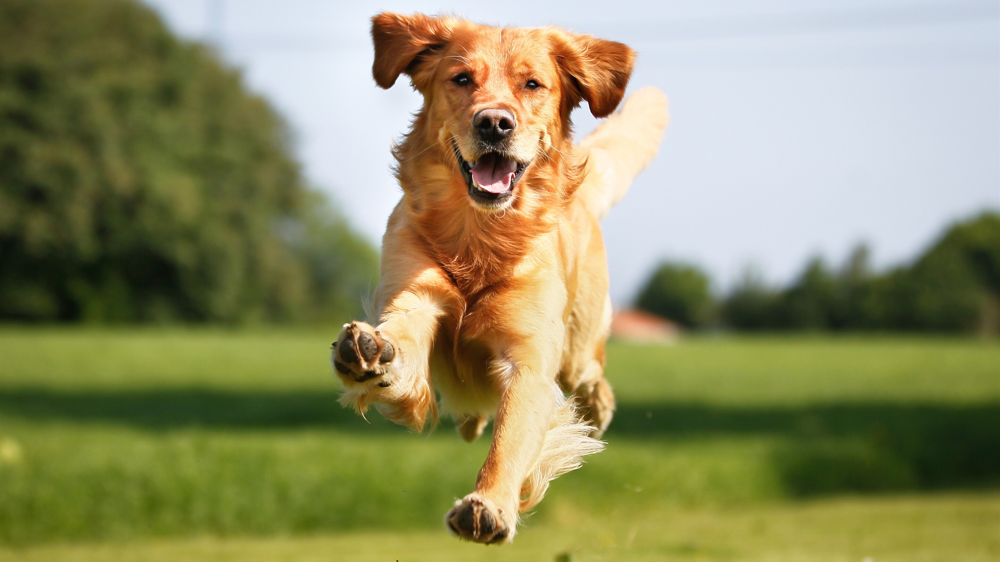

In [21]:
from PIL import Image

img2 = PILImage.create('Images/dog.jpeg')

Image.open("Images/dog.jpeg")

In [22]:
is_cat,_,probs = learn.predict(img2)
print(f"Is this a cat?: {is_cat}.")
print(f"Probability it's a cat: {probs[1].item():.6f}")

Is this a cat?: False.
Probability it's a cat: 0.000000


As seen from the above, this model has been able to accurately predict that this is not a cat, with a certainty of almost 100%

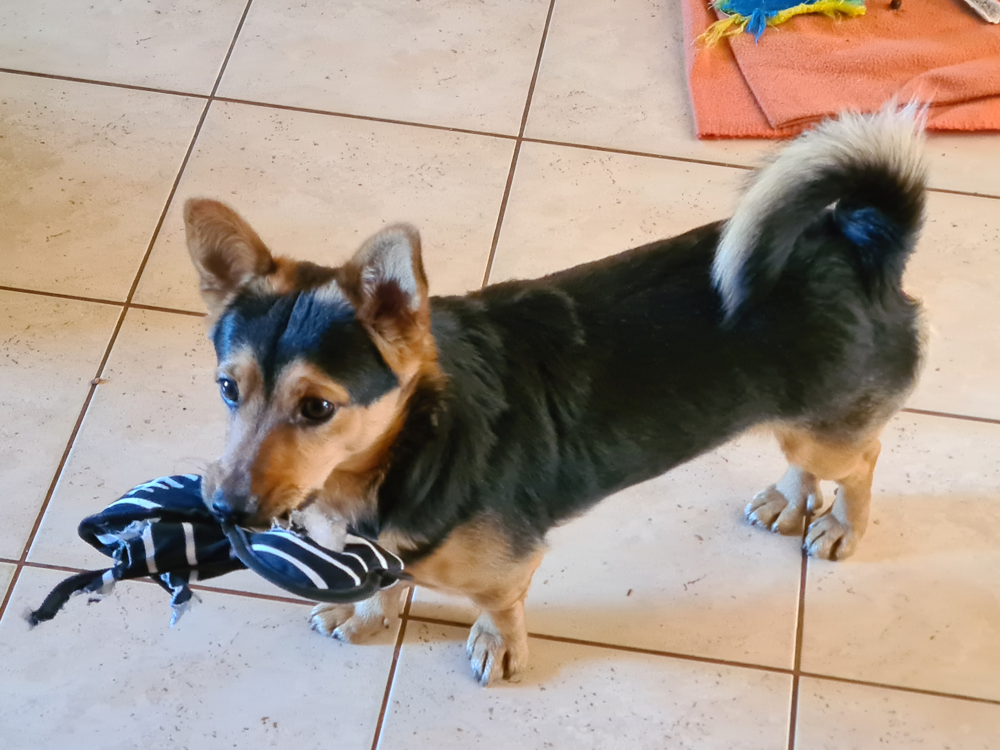

In [23]:
from PIL import Image

img3 = PILImage.create('Images/tecoz-dog.jpg')

Image.open("Images/tecoz-dog.jpg")

In [24]:
is_cat,_,probs = learn.predict(img3)
print(f"Is this a cat?: {is_cat}.")
print(f"Probability it's a cat: {probs[1].item():.6f}")

Is this a cat?: False.
Probability it's a cat: 0.000000


Here it is with a real life example, (Tecoz's Dog), and it is able to accurately represent that his dog is in fact... not a cat.

### Some notes about the course documents

This course is split into 2 main repositories, one being the book (which I highly recommend you purchase), and one with some material (which changes over time). It is a good idea to keep in touch with both, although it seems like going through the video courses and the book is satisfactory.

The 'Course v4' repository contains just the code + basic surrounding information, while the other course repositories contain all the prose, (i.e. the book). This allows for you to go deeper into the topic at hand, with some notes from tha authors as well.

#### Note on the Questionnaires. 
You are able to use this as an effective way to figure out what each chapter and notebook will be teaching you, and I will also be going through all of the different questions in a seperate Jupyter Notebook labelled 'Answers'. 

### Some more on 'Machine Learning'

Machine Learning is a method to get computers to complete a specific task. If you were to use regular programming to solve the previous task of identifying between cats and dogs, how would this be done?

Generally, steps are done where:

`inputs --> program --> output`

This general idea where a programmer would create a 'program' works great, although in more 'human' tasks such as identifying objects, it becomes a lot harder. A quote from Arthur Samuel (from all the way back in 1962! ) puts this problem quite well:

> "Programming a computer for such computations is, at best, a difficult task, not primarily because of any inherent complexity in the computer itself but, rather, because of the need to spell out every minute step of the process in the most exasperating detail. COmputers, as any programmer will tell you, are giant morons, not giant brains"


Samuel's basic idea was instead of telling a computer the exact steps required to solve a problem, but to instead show it examples of the problem to solve, and let the computer figure out how to solve it itself. This method ended up being successful, and also lays as the general foundation for Machine Learning today. A very important quote is the following:

> "Suppose we arrange for some automatic means of testing the effectiveness of any current weight assignment in terms of actual performance and provide a mechanism for altering the weight assignment so as to maximise the performance. We need not go into the details of such as procedure to see that it could be made entirely automatic and to see that a machine so programemed would "learn" from its experience."

From the above quote, note about the "automatic testing of the effectiveness of any current weight assignment in terms of actual performance", and a "mechanism for aterning the weight assignment so as to maximise the performance". This forms the very basis for any Machine Learning program, whereby a program is able to look at examples. and assess itself and alter itself depending on its performance.

### Some notes about the course documents

This course is split into 2 main repositories, one being the book (which I highly recommend you purchase), and one with some material (which changes over time). It is a good idea to keep in touch with both, although it seems like going through the video courses and the book is satisfactory.

The 'Course v4' repository contains just the code + basic surrounding information, while the other course repositories contain all the prose, (i.e. the book). This allows for you to go deeper into the topic at hand, with some notes from tha authors as well.

#### Note on the Questionnaires. 
You are able to use this as an effective way to figure out what each chapter and notebook will be teaching you, and I will also be going through all of the different questions in a seperate Jupyter Notebook labelled 'Answers'. 

### Some more on 'Machine Learning'

Machine Learning is a method to get computers to complete a specific task. If you were to use regular programming to solve the previous task of identifying between cats and dogs, how would this be done?

Generally, steps are done where:

`inputs --> program --> output`

This general idea where a programmer would create a 'program' works great, although in more 'human' tasks such as identifying objects, it becomes a lot harder. A quote from Arthur Samuel (from all the way back in 1962! ) puts this problem quite well:

> "Programming a computer for such computations is, at best, a difficult task, not primarily because of any inherent complexity in the computer itself but, rather, because of the need to spell out every minute step of the process in the most exasperating detail. COmputers, as any programmer will tell you, are giant morons, not giant brains"


Samuel's basic idea was instead of telling a computer the exact steps required to solve a problem, but to instead show it examples of the problem to solve, and let the computer figure out how to solve it itself. This method ended up being successful, and also lays as the general foundation for Machine Learning today. A very important quote is the following:

> "Suppose we arrange for some automatic means of testing the effectiveness of any current weight assignment in terms of actual performance and provide a mechanism for altering the weight assignment so as to maximise the performance. We need not go into the details of such as procedure to see that it could be made entirely automatic and to see that a machine so programemed would "learn" from its experience."

From the above quote, note about the *"automatic testing of the effectiveness of any current weight assignment in terms of actual performance"*, and a *"mechanism for atering the weight assignment so as to maximise the performance"*. This forms the very basis for any Machine Learning program, whereby a program is able to look at examples. and assess itself and alter itself depending on its performance. Such as model could be portrayed via:

`inputs and weights --> model --> outputs`

This simple flowchart represents the core of Machine Learning.

Taking Samuel's idea a bit further and making that system automatic like he mentioned would make a flowchart look a bit different, like:

`inputs and weights --> model --> results --> performance (which then goes back and updates the weights)`

Note that all of these flowcharts only represent the 'training' portion of a machine learning program. As after a program has been trained, it goes back to the general program format, whereby:

`inputs --> model --> output`

This allows for the program to still be light enough to be ran easilly, with the only hard work being actually computing the program itself (that's why you don't need to worry about having an expensive computer when searching google or playing against a chess bot).

Note that the *'program'* is replaced with *'model'*


***Therefore*** Machine Learning is:
> The training of programs developed by allowing a computer to learn from its experience, rather than through manually coding the individual steps.

### Now, What is a *'Neural Network'*?

It isn't obvious at all what a model may look like for an image recognition program, or one to understand text, or a program that is designed to solve any other problems.

To solve this, you would ideally have a function which is extremely flexible, and could be used to solve any given problem, just by manipulating weights. Amazingly this system does exist, and is referred to as a *'Neural Network'*.

Via the *universal approximation* proof, it shows that this function can solve a problem to any level of accuracy (in theory).

This will be discussed in more detail in later chapters.

### Bring on SGD!

The fact that neural networks are so flexible means that they are very often a suitable form of model for a situation, and you are able to focus your effort on the process of training a neural network (i.e. finding good weightings).

There is in fact a general way to update the weights of a neural network, which allows for it to improve in any given task, and this is the *Stochastic Gradient Descent* system (otherwise known as SGD). 

Conveniently, SGDs and Neural Networks both do not require a large amount of maths to understand, as it only uses addition and multiplication (although it *very* heavilly relies on it!). It is often cited as being much simpler than initially thought. 


#### Some changes in terminology

As Samuel was working on all of this in the late 1960s, a lot of terms have changed. I will list out the modern deep learning terminology for the previously discussed flowcharts.
- The functional form of a *'model'* is called its *'architecture'*, although some people use the word *'model'* as a synonym for *'architecture'*
- *'Weights'* are referred to as *'parameters'*
- *Predictions* are calculated from the *independent variables*, which is *data* not including the labels.
- *Results* of the model are called *predictions*
- The measure of performance is called the *loss*
- The *loss* depends not only on the predictions, but also the correct *labels*

The updated flowchart look something like:

`Inputs and Parameters --> Architecture --> Predictions (+ Labels) --> loss (which then loops back to parameters)`

#### Limitations inherent to Machine Learning

From the above flowchart, it is evident that there are some fundamental/'compulsory' things about training a deep learning model. These are:
- A model cannot be created without data
- A model can only learn to operate on the patterns seen in the input data used to train it
- This learning approach only creates *predictions*, not recommended *actions*
- It's not enough to just have examples of input data; you have to have *labels* for that data as well (e.g. pictures of dogs and cats aren't enough to train a model, you need a label for each one, saying which ones are dogs and which ones are cats).
  - It can also be quite difficult to label all the data.

#### Models interact with their environments

As models interact with their environments, this can create feedback loops, such as:
- A *predictive policing* model is created based on where arrests have been made in the past.
  - In practice this isn't actually predicting crime, but rather predicting arrests, and is therefore partially reflecting biases in existing policing processes
  - Law enforcement officers then might use that model to decide where to focus their activity, resulting in increases arrests in those areas
  - These additional arrests would then feed back to re-training future versions of the model
  - This results in a positive feedback loop, where the more the model is used, the more biased the data becomes, making the model even more biased. 


Note that often data collected can be referred to as a *'proxy'* for something else (for example, in the above example, number of arrests proxies for crime). It is important to realise that there can be potential unintended consequences for different proxies, and therefore it is important to look through potential proxies (and also to potentially use multiple) to get the most accurate indication of change. In the end, the difference between the proxy and the value can be quite significant.

#### Explaining some of the code from before

Although there was some explanation for the code above (by me, although especially for things which I ended up adding), this is me taking notes on what is mentioned during the course. This code is below:


In [2]:
# CLICK ME
from fastai.vision.all import *
path = untar_data(URLs.PETS)/'images'

def is_cat(x): return x[0].isupper()
dls = ImageDataLoaders.from_name_func(
    path, get_image_files(path), valid_pct=0.2, seed=42,
    label_func=is_cat, item_tfms=Resize(224))

learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.180957,0.019487,0.007442,00:31


epoch,train_loss,valid_loss,error_rate,time
0,0.062309,0.008690,0.006089,00:42


For convenience, I will go through each line individually, to allow for the actual code to not be as convoluted.

In [ ]:
from fastai.vision.all import *

This line imports the libraries needed to be able to run the code below. 

In Python you cannot use anything from an external library unless you *'import'* from it.

Note than normally you would not use the `*` wildcard, and just import the specific frameworks, or commands that you need.

As FastAI is designed to be used in a very quick way, with rapid prototyping, you are able to import all of it without worrying about any performance issues, while having the convenience of everything being ready.